<a href="https://colab.research.google.com/github/perezrmaria/intonation_analysis/blob/main/vibrato_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Index


1. [Obtaining the vibrato of the longest notes](#obtaining-the-vibrato-of-the-longest-notes)

2. [Modelling vibrato](#modelling-vibrato)

3. [All the note longitude](#all-the-note-longitude)

4. [For only the most sinusoidal part of the note with vibrato](#for-only-the-most-sinusoidal-part-of-the-note-with-vibrato)

5. [Select the sinusoidal part](#select-the-sinusoidal-part)

6. [Model the vibrato of the selected part](#model-the-vibrato-of-the-selected-part)

7. [Looking for the temporal variance of the amplitude and the mean](#looking-for-the-temporal-variance-of-the-amplitude-and-the-mean)

8. [Temporal variance of the amplitude and the mean for the sinusoidal part](#for-the-sinusoidal-part)

In [1]:
%pip install pretty_midi

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pretty_midi
import librosa
import statistics
from tqdm import tqdm
import os
from scipy.signal import hilbert, find_peaks
from scipy.interpolate import interp1d

from google.colab import drive
drive.mount('/content/drive')

import sys
sys.path.append('/content/drive/Shareddrives/Master Thesis')
import midi_functions
import peak_functions
import freqvibrato_functions
import dict_functions
import trim_functions

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Obtaining the vibrato of the longest notes

In [3]:
import pandas as pd
folder_path = '/content/drive/Shareddrives/Master Thesis/iter1_midi/Kayser/Op20-01'
file_list = os.listdir(folder_path)
note_durations = []
mean_frequencies = {}
dictionary_df = {}
recordings_note_events = {}
all_plots = {}
keys_dictionary_df = {}

fs = 172.41
for file_name in tqdm(file_list):
    if file_name.endswith('.mid'):
        file_path = os.path.join(folder_path, file_name)
        midi_data = pretty_midi.PrettyMIDI(file_path)
        notes_df, longest_notes = midi_functions.look_longest_notes(midi_data)

        all_pitch_bends = []
        for instrument in midi_data.instruments:
            all_pitch_bends += instrument.pitch_bends

        longest_notes = notes_df.nlargest(10, 'duration')
        longest_note = longest_notes.iloc[0]
        pitch_bends_in_longest_note = [event for event in all_pitch_bends if longest_note.start_time <= event.time < longest_note.end_time]
        pitch_bends_in_longest_note = sorted(pitch_bends_in_longest_note, key=lambda event: event.time, reverse=False)

        pitch_bend_times = [event.time for event in pitch_bends_in_longest_note]
        pitch_bend_values = [event.pitch for event in pitch_bends_in_longest_note]

        pitch_bend_values = [pitch_bend_values] if isinstance(pitch_bend_values, int) else pitch_bend_values
        for i in range(len(pitch_bend_values)):
            pitch_bend_values[i] = midi_functions.pitch_bend_to_cents(pitch_bend_values[i])


        mk_pitch_bends_df = pd.DataFrame({'time': pitch_bend_times, 'pitch_bend_value': pitch_bend_values})
        mk_longest_notes = pd.DataFrame(longest_notes)
        mk_notes_df = pd.DataFrame(notes_df)
        fs =172.41
        keys_dictionary_df[file_name] = mk_longest_notes


        #mean pitch bend
        mean_pitch_bend = mk_pitch_bends_df['pitch_bend_value'].mean()
        std_pitch_bend = mk_pitch_bends_df['pitch_bend_value'].std()

        analytic_signal = hilbert(pitch_bend_values)

        instantaneous_phase = np.unwrap(np.angle(analytic_signal))
        instantaneous_frequency = np.diff(instantaneous_phase) / (2.0*np.pi) * fs
        mean_frequency = np.mean(instantaneous_frequency)
        mean_frequencies[file_name] = mean_frequency

        recording_note_events = pd.DataFrame({'start': mk_longest_notes['start_time'],'end': mk_longest_notes['end_time'], 'mean intonation': mean_pitch_bend, 'average intonation amplitude': std_pitch_bend, 'mean frequency': mean_frequency})
        recordings_note_events[file_name] = recording_note_events

        mk_pitch_bends_df = pd.DataFrame({'time': pitch_bend_times, 'pitch_bend_value': pitch_bend_values})
        dictionary_df[file_name] = mk_pitch_bends_df

        plt.plot(pitch_bend_times, pitch_bend_values)
        plt.axhline(y=0, color='r', linestyle='--')
        plt.xlabel('Time (s)')
        plt.ylabel('Pitch bend value (cents)')
        plt.title('Pitch bend events in longest note')

        all_plots[file_name] = (pitch_bend_times, pitch_bend_values)

        plt.clf()

100%|██████████| 8/8 [00:10<00:00,  1.37s/it]


<Figure size 640x480 with 0 Axes>

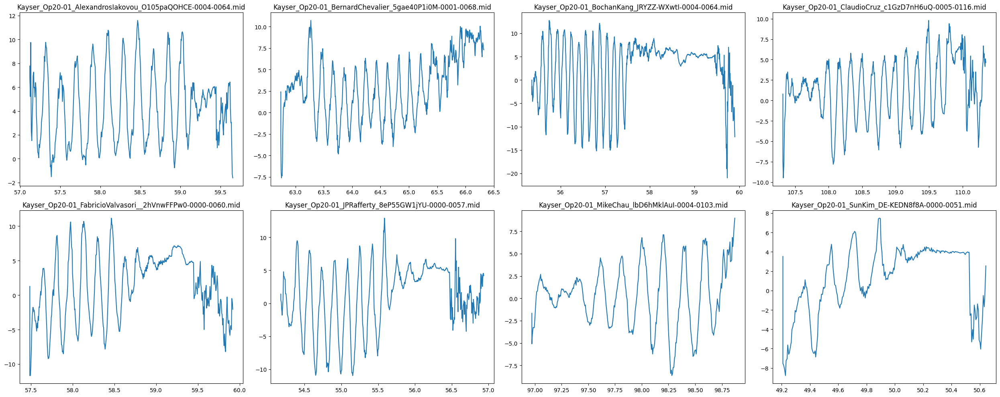

In [4]:
num_plots = len(all_plots)
num_rows = (num_plots // 4)
fig, axes = plt.subplots(num_rows, 4, figsize=(25, 10))
axes = axes.flatten()
plt.title('Pitch bend events in longest note')

for i, (key, plot_data) in enumerate(all_plots.items()):
    if i < num_plots:
        ax = fig.add_subplot(axes[i])
        ax.plot(*plot_data)
        ax.set_title(key)

plt.tight_layout()
plt.show()

# Modelling vibrato

## All the note longitude

Kayser_Op20-01_AlexandrosIakovou_O105paQOHCE-0004-0064.mid 

mean: 4.368720502002288
amplitude: 4.275579918746871
frequency: 5.56


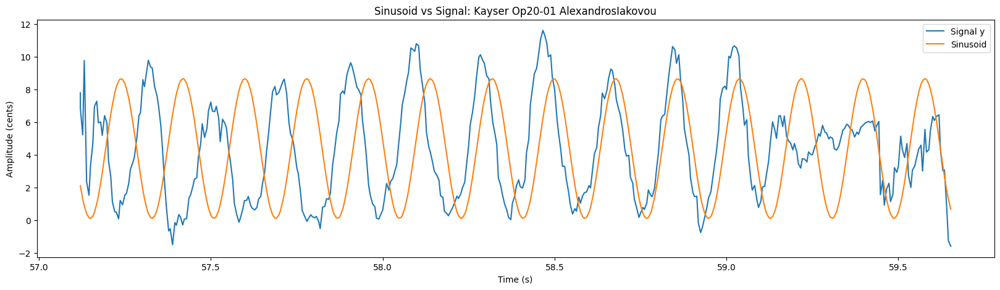

Kayser_Op20-01_BernardChevalier_5gae40P1i0M-0001-0068.mid 

mean: 3.034494146945793
amplitude: 4.408228013759585
frequency: 5.19


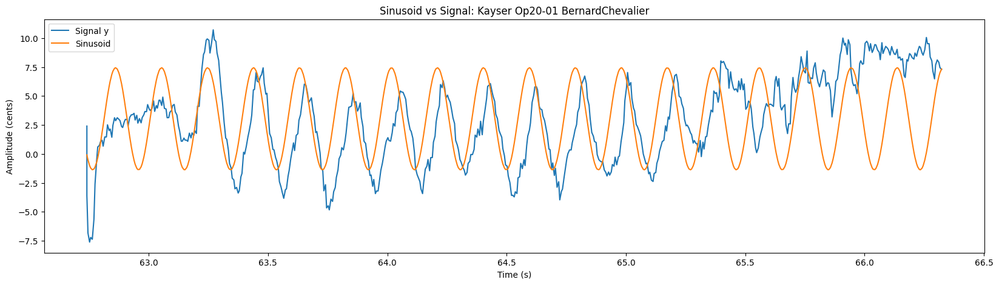

Kayser_Op20-01_BochanKang_JRYZZ-WXwtI-0004-0064.mid 

mean: 2.2597332389987246
amplitude: 5.970658343123759
frequency: 7.98


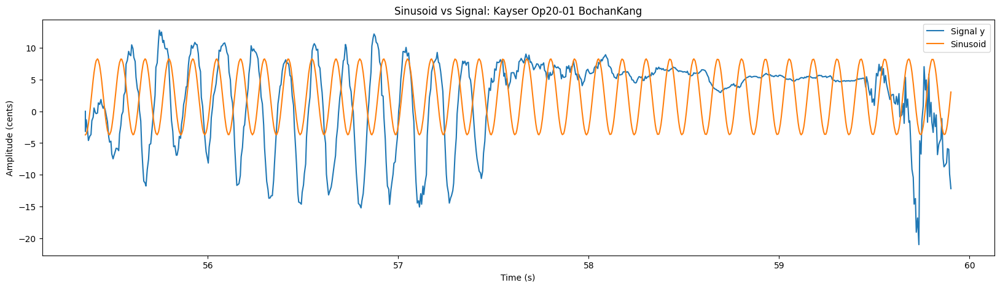

Kayser_Op20-01_ClaudioCruz_c1GzD7nH6uQ-0005-0116.mid 

mean: 1.3329938082576482
amplitude: 4.32653905688513
frequency: 6.28


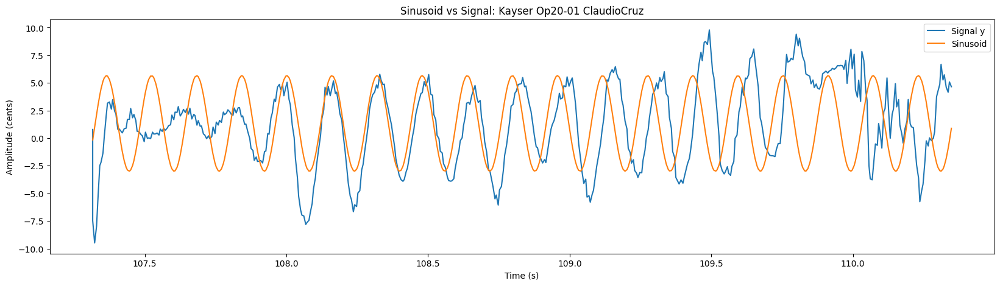

Kayser_Op20-01_FabricioValvasori__2hVnwFFPw0-0000-0060.mid 

mean: 1.3919793991815477
amplitude: 5.03434764972363
frequency: 10.38


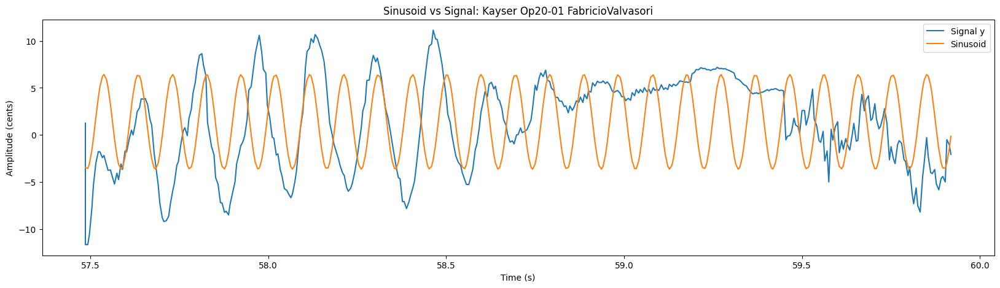

Kayser_Op20-01_JPRafferty_8eP55GW1jYU-0000-0057.mid 

mean: 1.0788348542542017
amplitude: 5.5610316222613525
frequency: 11.9


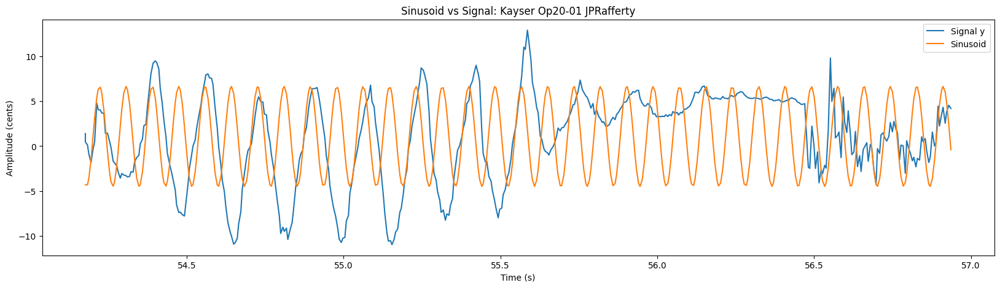

Kayser_Op20-01_MikeChau_lbD6hMklAuI-0004-0103.mid 

mean: 0.3428389386432927
amplitude: 4.623643934168346
frequency: 5.15


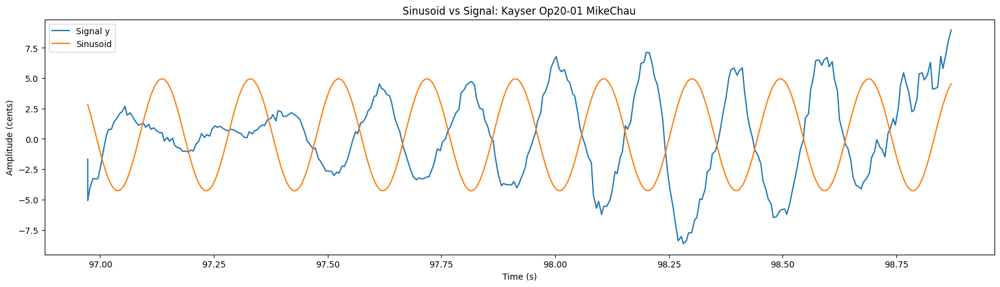

Kayser_Op20-01_SunKim_DE-KEDN8f8A-0000-0051.mid 

mean: 1.2879894625756048
amplitude: 3.55567438727563
frequency: 5.85


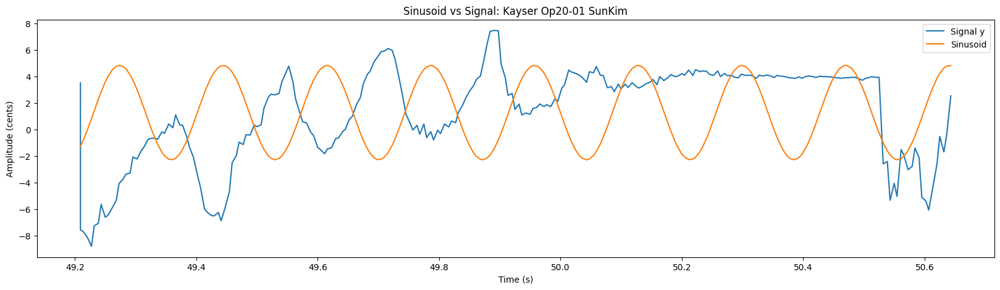

In [11]:
for keys, values in dictionary_df.items():
    print(keys,'\n')
    my_signal = values['pitch_bend_value']
    my_time = values['time']
    name_part = keys.split('_')[0]+' '+keys.split('_')[1]+' '+keys.split('_')[2]

    title = 'Filtered Signal with First and Last Peaks: ' + name_part
    vibrato_frequency = freqvibrato_functions.find_frrt_frequency(my_signal)
    interpolated_values_upp, interpolated_values_down, frequency_peaks = freqvibrato_functions.find_peaks_and_interpolate(my_signal, my_time, name_part)
    phase_shift = 0.0
    freqvibrato_functions.model_vibrato_sinusoid(my_signal, my_time, name_part, interpolated_values_down=interpolated_values_down, interpolated_values_upp=interpolated_values_upp, rfft_frequency=frequency_peaks, phase_shift=phase_shift, plot_yes=True)


## For only the most sinusoidal part of the note with vibrato

### Select the sinusoidal part

In [6]:
filename = 'Kayser_Op20-01_JPRafferty_8eP55GW1jYU-0000-0057.mid'
name_part = filename.split('_')[0]+' '+filename.split('_')[1]+' '+filename.split('_')[2]
print(name_part)

Kayser Op20-01 JPRafferty


Kayser_Op20-01_ClaudioCruz_c1GzD7nH6uQ-0005-0116.mid


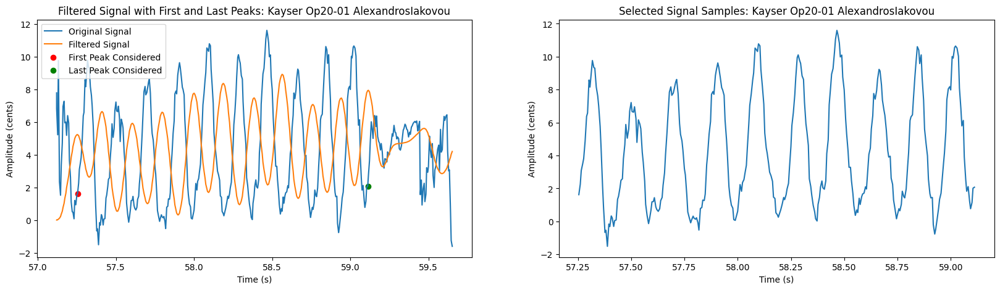

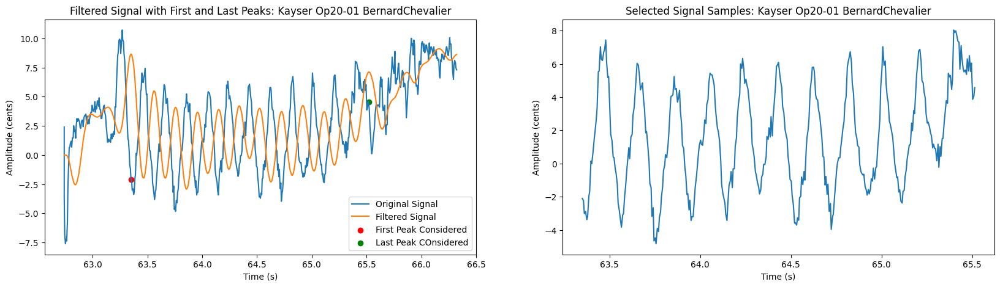

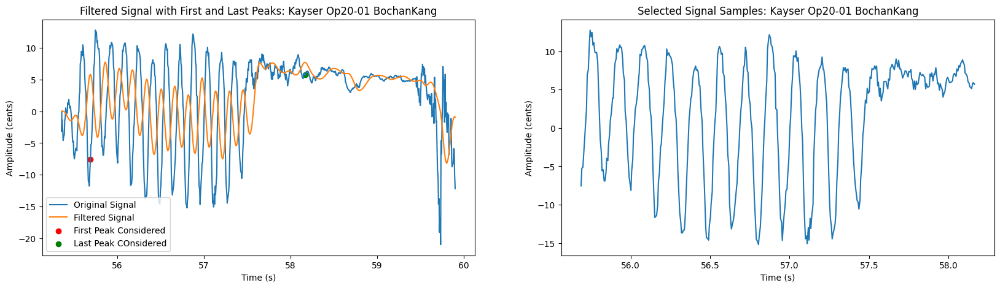

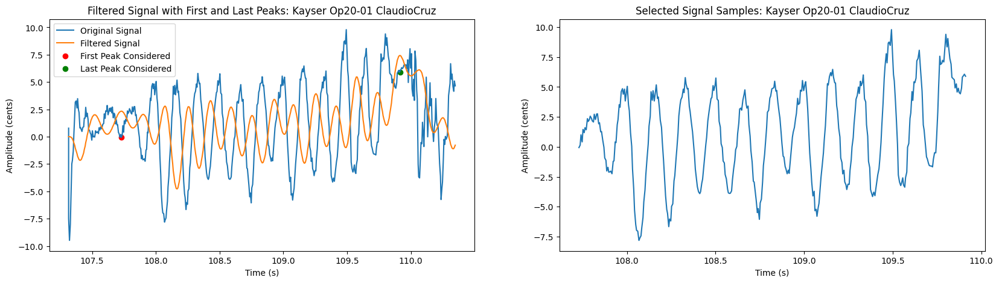

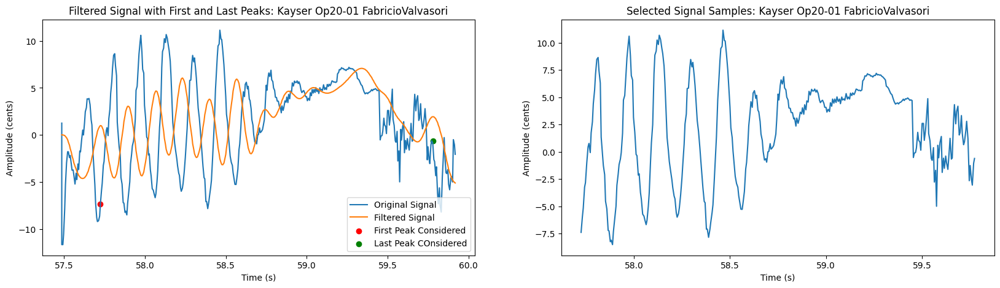

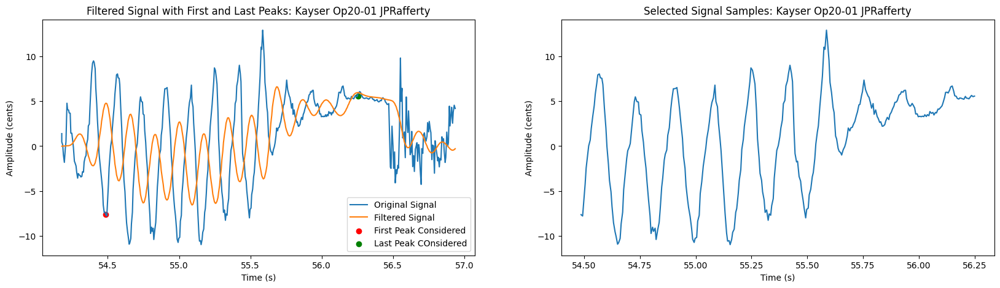

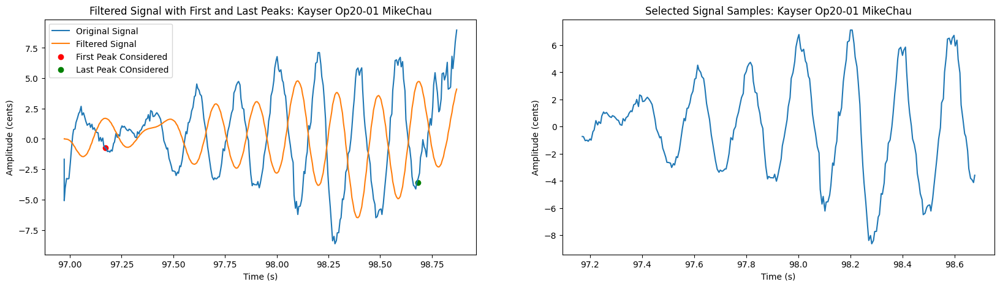

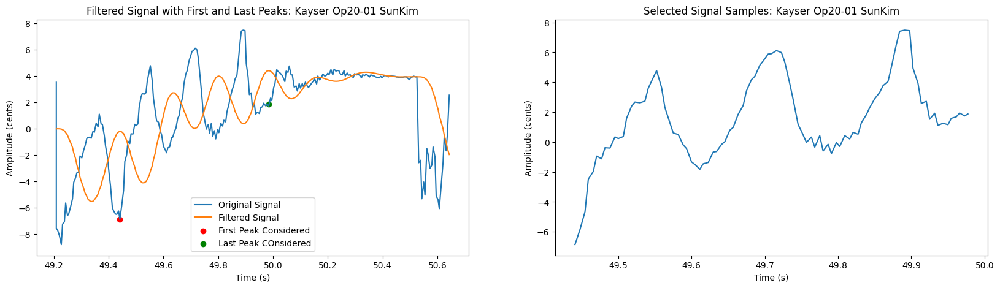

In [7]:
keys_list = list(dictionary_df.keys())
first_key = keys_list[3]
print(first_key)
vibrato_df = dictionary_df[first_key]
#print(vibrato_df)

dictionary_df_selected_samples ={}
keys_list = list(dictionary_df.keys())
for keys, values in dictionary_df.items():
    name_part = keys.split('_')[0]+' '+keys.split('_')[1]+' '+keys.split('_')[2]
    vibrato_df = dictionary_df[keys]
    my_signal = vibrato_df['pitch_bend_value']
    t = vibrato_df['time']

    filtered_signal = freqvibrato_functions.apply_lowpass_filter(my_signal, 5.2, 172.41)
    peaks_filtered_signal, _ = find_peaks(filtered_signal, prominence=2.5, distance=1.5)
    first_peak_index = peaks_filtered_signal[0]
    last_peak_index = peaks_filtered_signal[-1]
    selected_signal_samples = my_signal.iloc[first_peak_index:last_peak_index]
    selected_time_samples = t.iloc[first_peak_index:last_peak_index]

    df_selected_samples = pd.DataFrame({'selected_signal_samples': selected_signal_samples, 'selected_time_samples': selected_time_samples})

    dictionary_df_selected_samples[keys] = df_selected_samples.reset_index(drop=True)

    plt.figure(figsize=(20, 5))
    title = 'Filtered Signal with First and Last Peaks: ' + name_part
    plt.subplot(1, 2, 1)
    plt.plot(t, my_signal, label='Original Signal')
    plt.plot(t, filtered_signal, label='Filtered Signal')
    plt.scatter(t.iloc[first_peak_index], selected_signal_samples.iloc[0], color='red', label='First Peak Considered')
    plt.scatter(t.iloc[last_peak_index], selected_signal_samples.iloc[-1], color='green', label='Last Peak COnsidered')
    plt.legend()
    plt.title(title)
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude (cents)")


    plt.subplot(1, 2, 2)
    title = 'Selected Signal Samples: ' + name_part
    plt.plot(t.iloc[first_peak_index:last_peak_index], selected_signal_samples)
    plt.title(title)
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude (cents)")
    plt.show()

### Model the vibrato of the selected part


Kayser Op20-01 AlexandrosIakovou 

mean: 4.394989013671875
amplitude: 4.935587717471527
frequency: 5.39


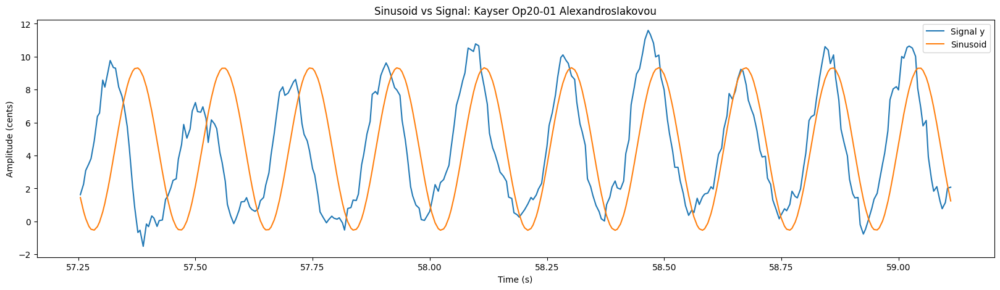

Kayser Op20-01 BernardChevalier 

mean: 1.633287690599866
amplitude: 4.681712581362238
frequency: 5.19


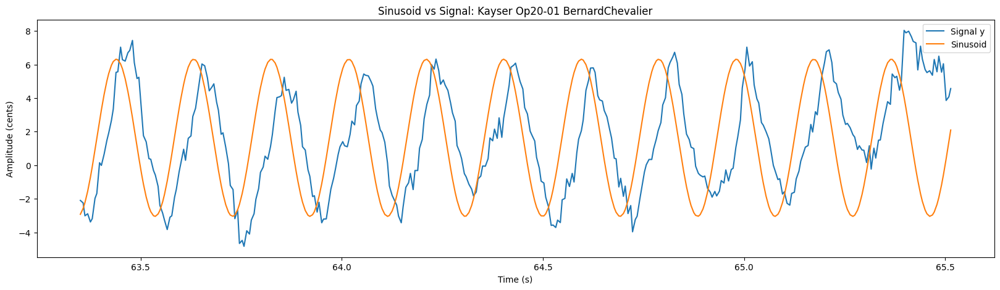

Kayser Op20-01 BochanKang 

mean: 1.7127293892710773
amplitude: 8.978117311152058
frequency: 6.29


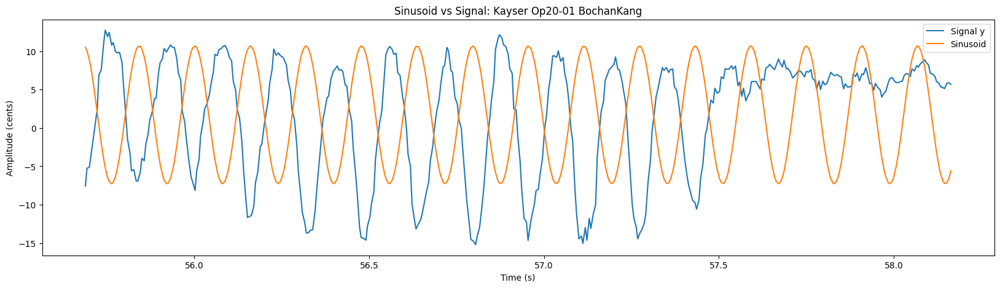

Kayser Op20-01 ClaudioCruz 

mean: 1.201710802443484
amplitude: 5.313133302660526
frequency: 6.05


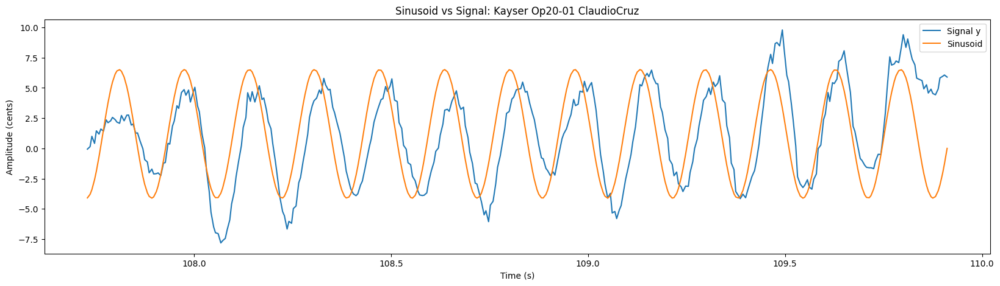

Kayser Op20-01 FabricioValvasori 

mean: 2.2938498694228047
amplitude: 4.929960099511186
frequency: 6.39


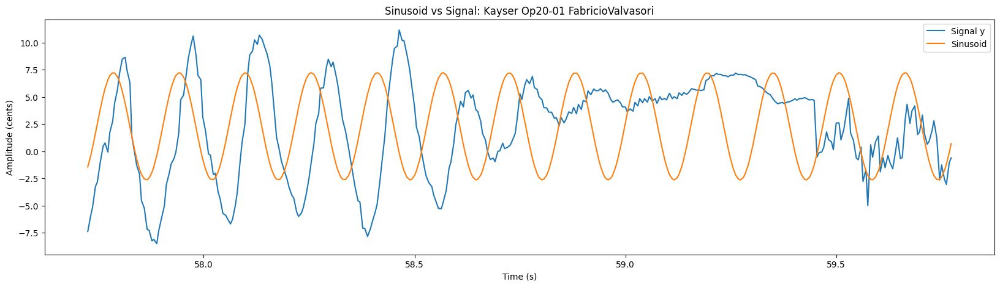

Kayser Op20-01 JPRafferty 

mean: 0.8179112484580592
amplitude: 7.0978674833343405
frequency: 5.95


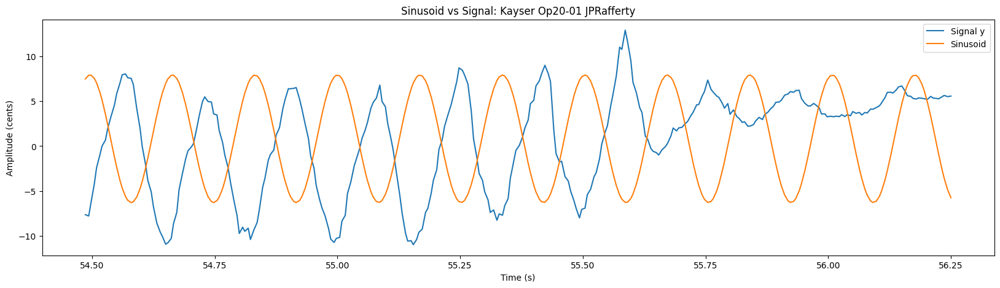

Kayser Op20-01 MikeChau 

mean: 0.039625901442307696
amplitude: 5.4549881566450225
frequency: 5.19


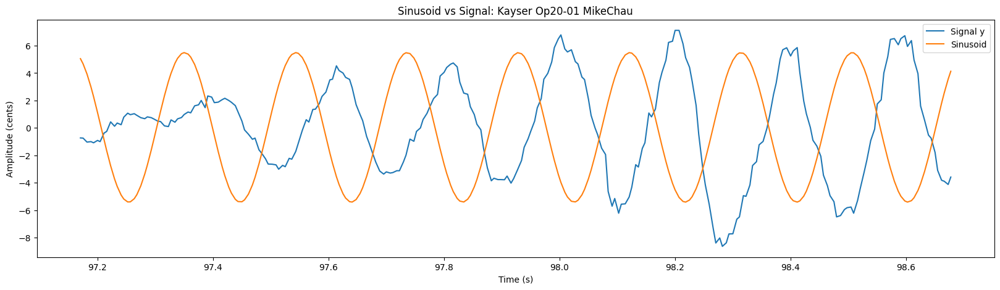

Kayser Op20-01 SunKim 

mean: 1.6130344842069892
amplitude: 3.720963257137587
frequency: 5.76


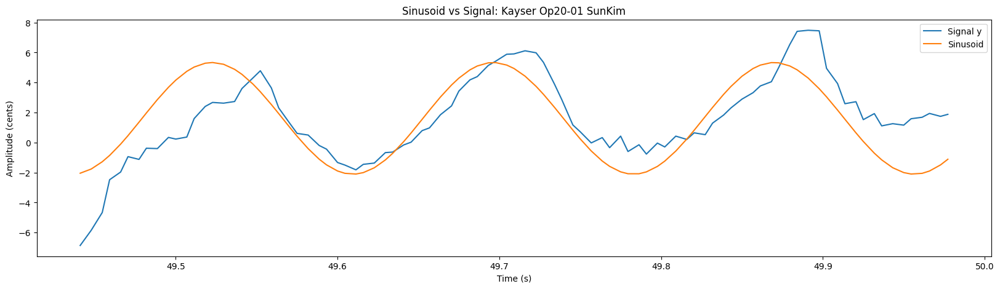

In [8]:
for keys, values in dictionary_df_selected_samples.items():
    name_part = keys.split('_')[0]+' '+keys.split('_')[1]+' '+keys.split('_')[2]
    print(name_part, '\n')

    my_selected_signal = values['selected_signal_samples']
    my_selected_time = values['selected_time_samples']
    vibrato_frequency = freqvibrato_functions.find_frrt_frequency(my_selected_signal)
    interpolated_values_upp, interpolated_values_down, frequency_peaks = freqvibrato_functions.find_peaks_and_interpolate(my_selected_signal, my_selected_time, name_part)
    phase_shift = 0.0
    freqvibrato_functions.model_vibrato_sinusoid(my_selected_signal, my_selected_time, name_part, interpolated_values_down=interpolated_values_down, interpolated_values_upp=interpolated_values_upp, rfft_frequency=frequency_peaks, phase_shift=phase_shift, plot_yes=True)


# Looking for the temporal variance of the amplitude and the mean

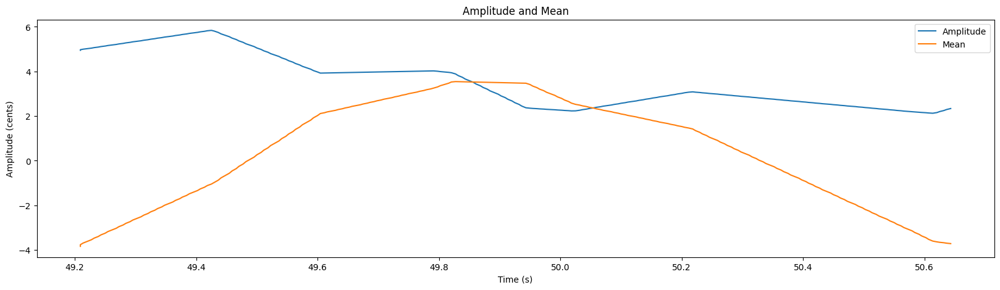

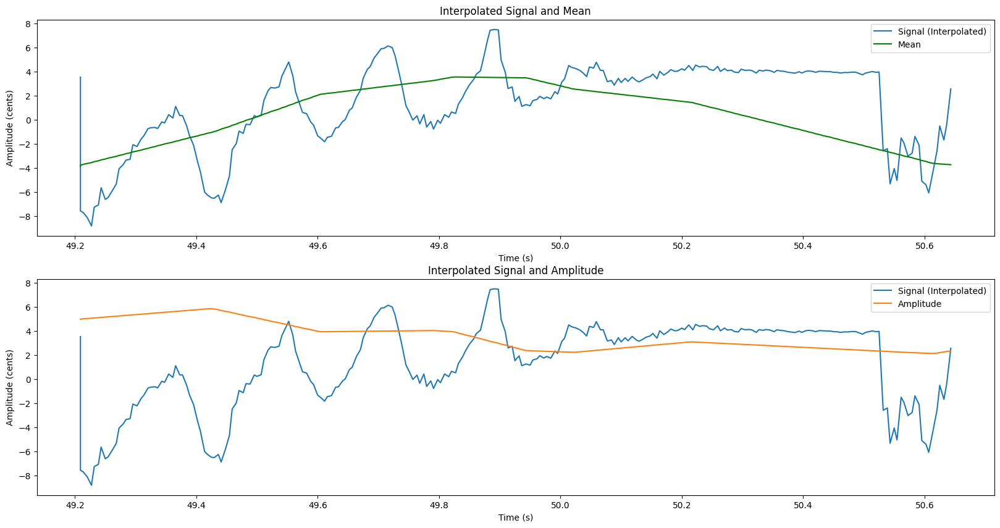

In [19]:
name_part ='Bernard Chevalier'
interpolated_values_upp, interpolated_values_down, overall_median = freqvibrato_functions.find_peaks_and_interpolate(my_signal, my_time, name_part)
amplitude = (interpolated_values_upp - interpolated_values_down)/2
mean = (interpolated_values_upp + interpolated_values_down)/2
#my_new_time = np.linspace(my_time[0], my_time[-1], len(amplitude))


plt.figure(figsize=(20, 5))
plt.plot(my_time,amplitude, label='Amplitude')
plt.plot(my_time,mean, label='Mean')
plt.legend()
plt.title("Amplitude and Mean")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude (cents)")
plt.show()

interp_func = interp1d(np.arange(len(my_signal)), my_signal)
signal_interpolated = interp_func(np.linspace(0, len(my_signal)-1, len(mean)))

plt.figure(figsize=(20, 10))
plt.subplot(2, 1, 1)
plt.plot(my_time, signal_interpolated, label='Signal (Interpolated)')
plt.plot(my_time, mean, label='Mean', color='green')
plt.legend()
plt.title("Interpolated Signal and Mean")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude (cents)")

plt.subplot(2, 1, 2)
plt.plot(my_time, signal_interpolated, label='Signal (Interpolated)')
plt.plot(my_time, amplitude, label='Amplitude')
plt.legend()
plt.title("Interpolated Signal and Amplitude")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude (cents)")
plt.show()


Kayser_Op20-01_AlexandrosIakovou_O105paQOHCE-0004-0064.mid 



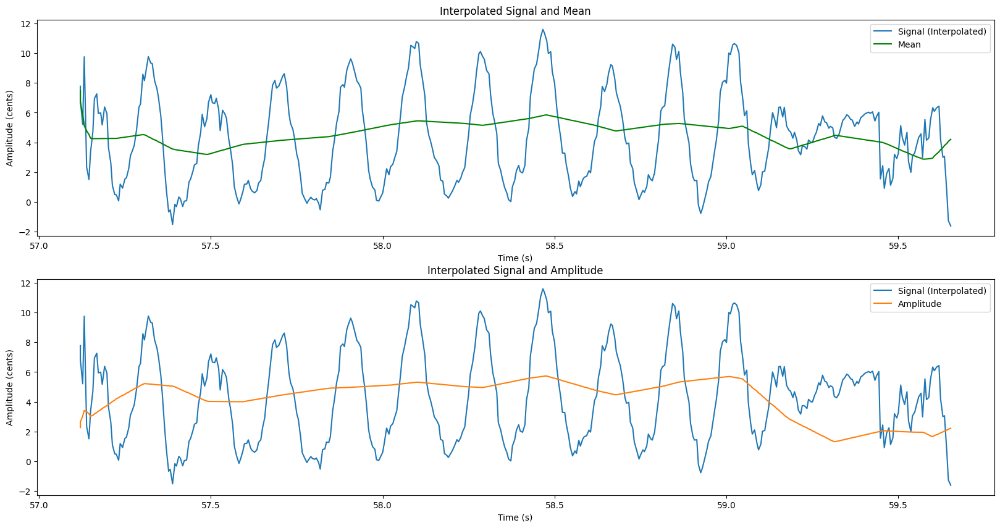

sinusoid 437
Kayser_Op20-01_BernardChevalier_5gae40P1i0M-0001-0068.mid 



<Figure size 640x480 with 0 Axes>

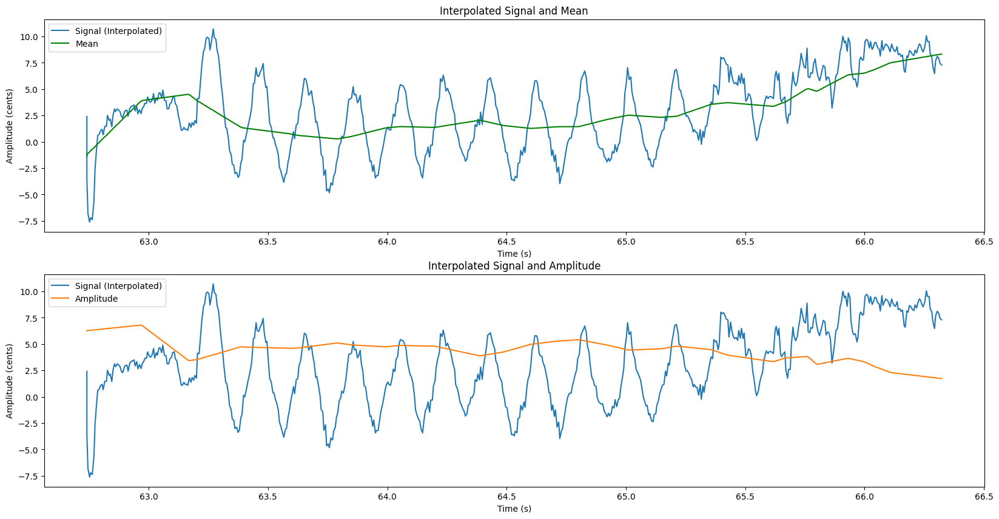

sinusoid 618
Kayser_Op20-01_BochanKang_JRYZZ-WXwtI-0004-0064.mid 



<Figure size 640x480 with 0 Axes>

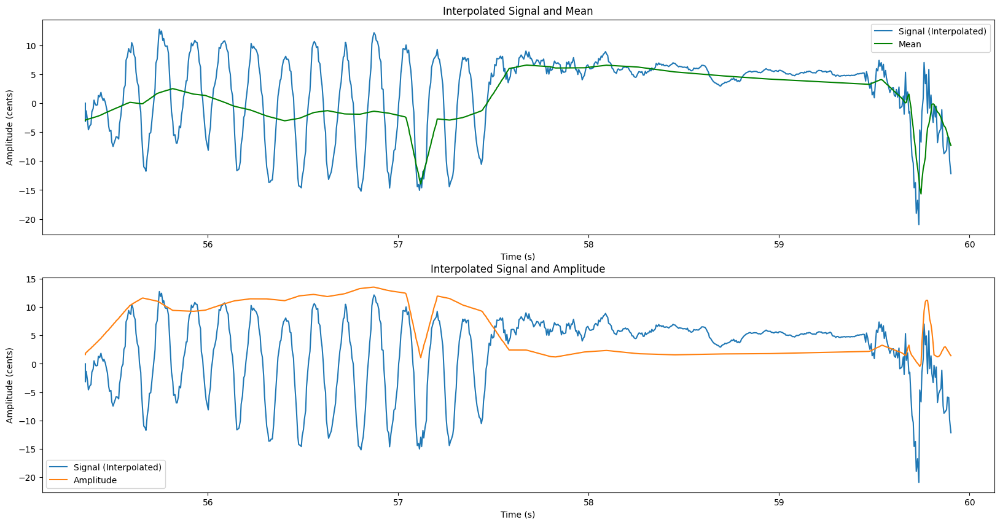

sinusoid 784
Kayser_Op20-01_ClaudioCruz_c1GzD7nH6uQ-0005-0116.mid 



<Figure size 640x480 with 0 Axes>

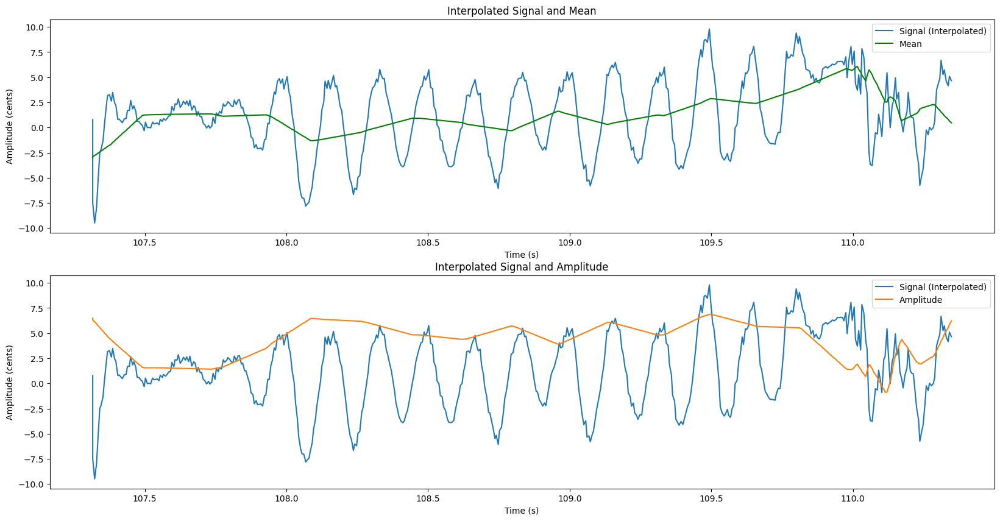

sinusoid 523
Kayser_Op20-01_FabricioValvasori__2hVnwFFPw0-0000-0060.mid 



<Figure size 640x480 with 0 Axes>

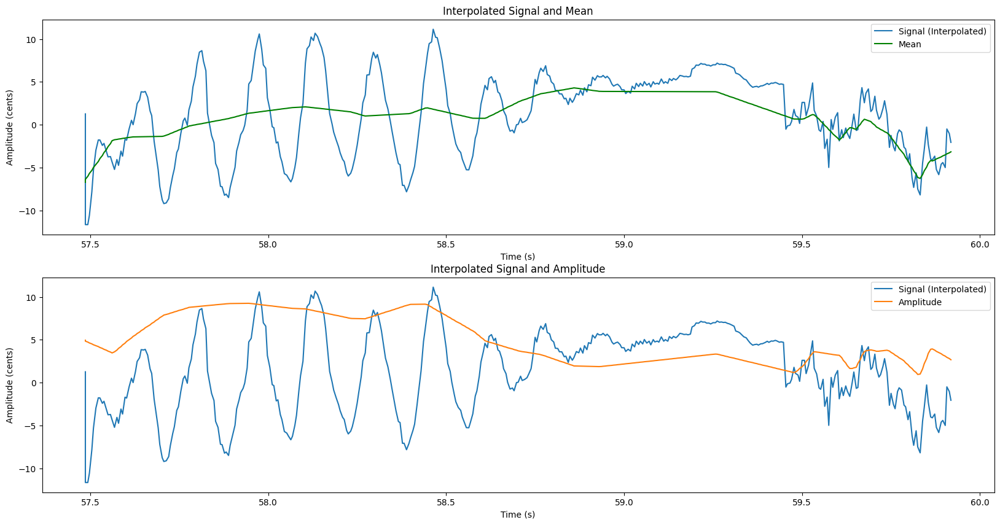

sinusoid 420
Kayser_Op20-01_JPRafferty_8eP55GW1jYU-0000-0057.mid 



<Figure size 640x480 with 0 Axes>

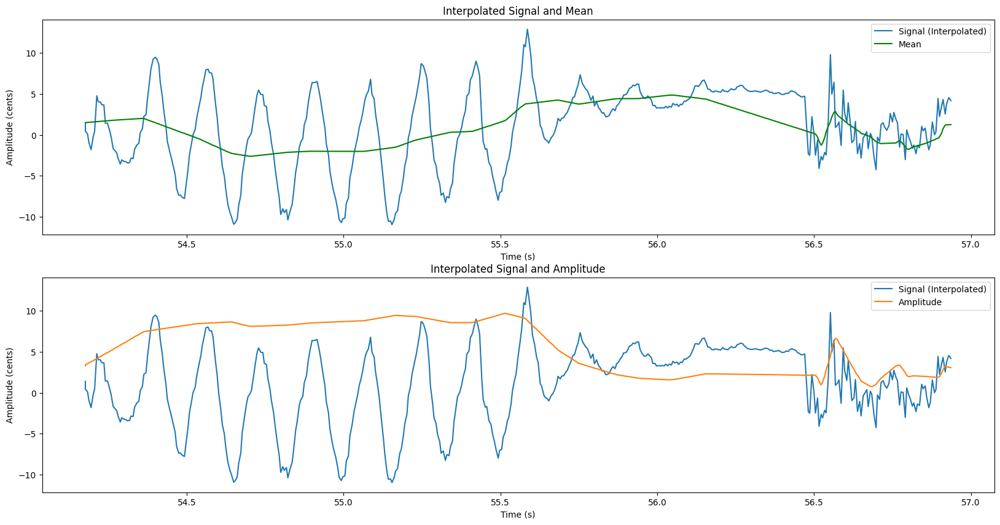

sinusoid 476
Kayser_Op20-01_MikeChau_lbD6hMklAuI-0004-0103.mid 



<Figure size 640x480 with 0 Axes>

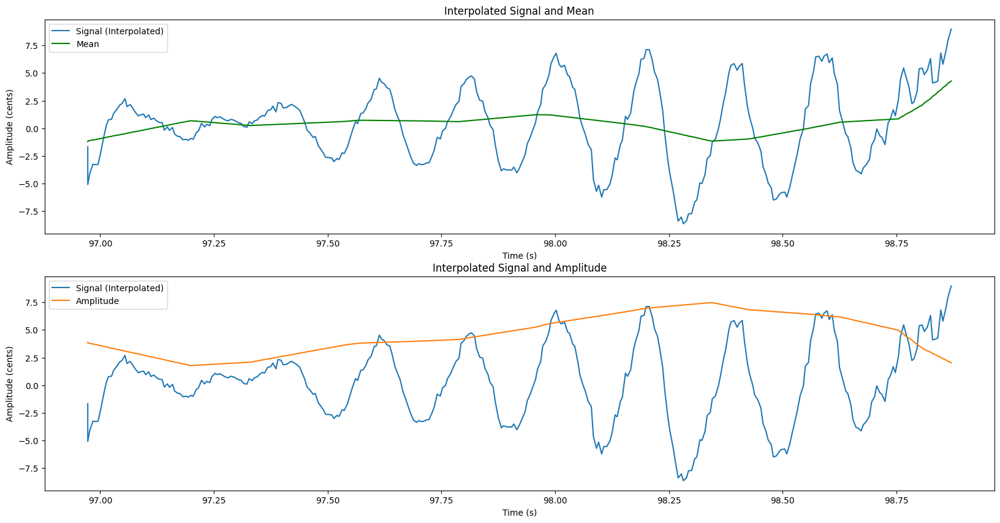

sinusoid 328
Kayser_Op20-01_SunKim_DE-KEDN8f8A-0000-0051.mid 



<Figure size 640x480 with 0 Axes>

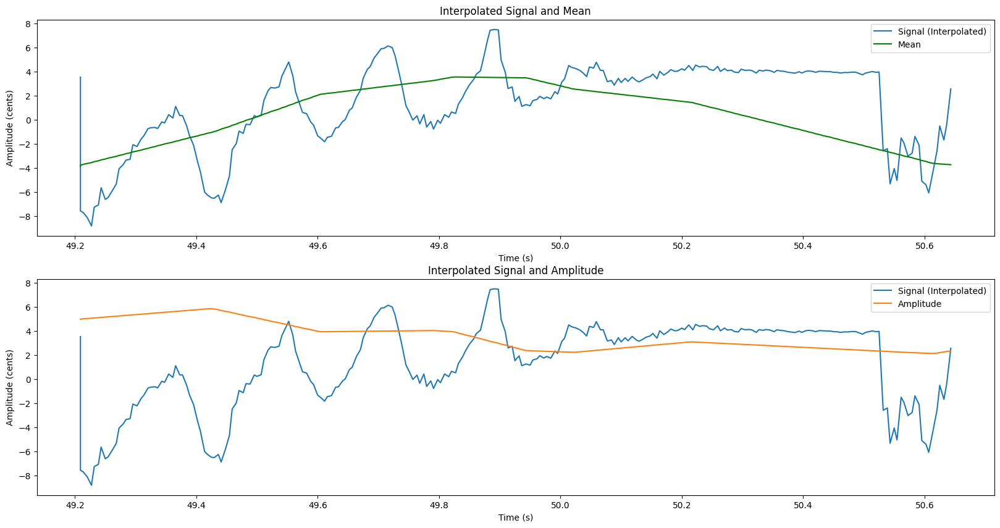

sinusoid 248


<Figure size 640x480 with 0 Axes>

In [20]:
for keys, values in dictionary_df.items():
    print(keys,'\n')
    my_signal = values['pitch_bend_value']
    my_time = values['time']
    name_part = keys.split('_')[0]+' '+keys.split('_')[1]+' '+keys.split('_')[2]

    title = 'Filtered Signal with First and Last Peaks: ' + name_part
    vibrato_frequency = freqvibrato_functions.find_frrt_frequency(my_signal)
    interpolated_values_upp, interpolated_values_down, frequency_peaks = freqvibrato_functions.find_peaks_and_interpolate(my_signal, my_time, name_part)

    amplitude = (interpolated_values_upp - interpolated_values_down)/2
    mean = (interpolated_values_upp + interpolated_values_down)/2

    interp_func = interp1d(np.arange(len(my_signal)), my_signal)
    signal_interpolated = interp_func(np.linspace(0, len(my_signal)-1, len(mean)))

    peak_functions.draw_vibrato_plots(my_time, signal_interpolated, mean, amplitude)

    phase_shift = 0.0
    sinusoid = freqvibrato_functions.model_time_varying_vibrato_sinusoid(my_signal, my_time, name_part, mean, amplitude, frequency_peaks, phase_shift)

    all_plots[keys] = (my_time, signal_interpolated, sinusoid)
    plt.clf()



8


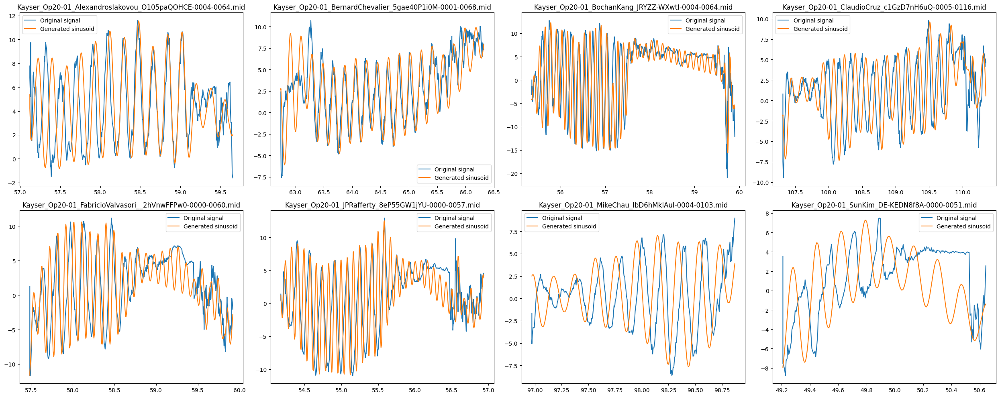

In [21]:
num_plots = len(all_plots)
print(num_plots)
num_rows = (num_plots // 4)
fig, axes = plt.subplots(num_rows, 4, figsize=(25, 10))
axes = axes.flatten()
plt.title('Pitch bend events in longest note')

for i, (key, plot_data) in enumerate(all_plots.items()):
    if i < num_plots:
        ax = fig.add_subplot(axes[i])

        signal1 = plot_data[1]
        ax.plot(plot_data[0], signal1, label='Original signal')

        signal2 = plot_data[2]
        ax.plot(plot_data[0], signal2, label='Generated sinusoid')

        ax.set_title(key)
        ax.legend()

plt.tight_layout()
plt.show()

## For the sinusoidal part only

Kayser Op20-01 AlexandrosIakovou 



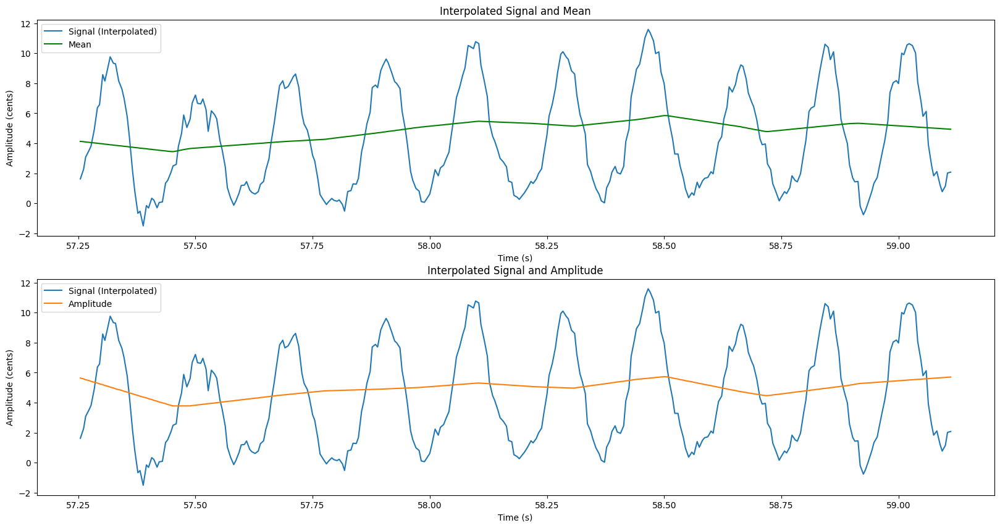

sinusoid 320
Kayser Op20-01 BernardChevalier 



<Figure size 640x480 with 0 Axes>

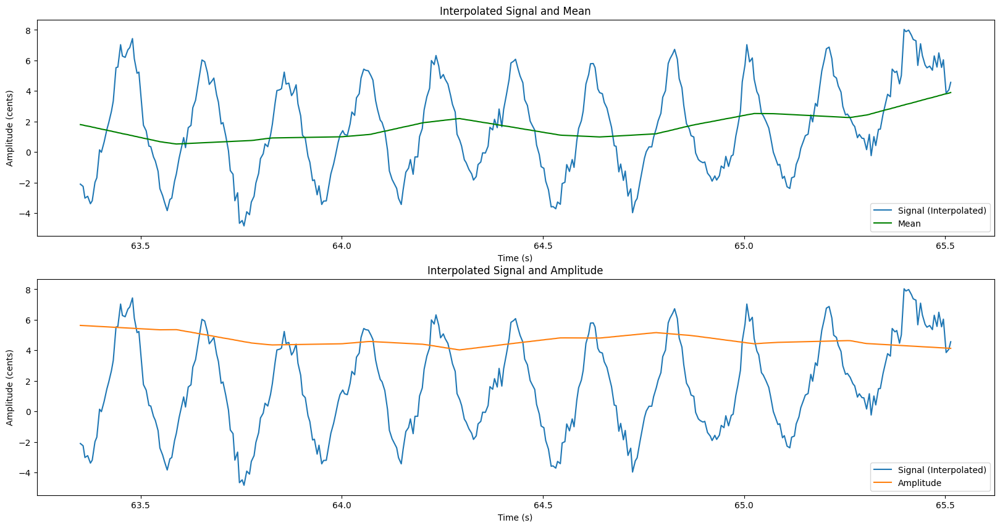

sinusoid 373
Kayser Op20-01 BochanKang 



<Figure size 640x480 with 0 Axes>

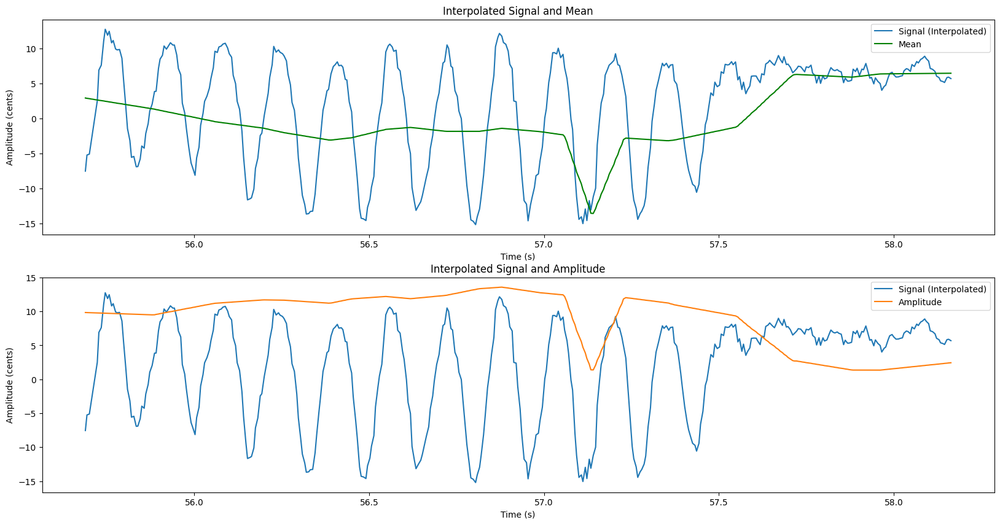

sinusoid 427
Kayser Op20-01 ClaudioCruz 



<Figure size 640x480 with 0 Axes>

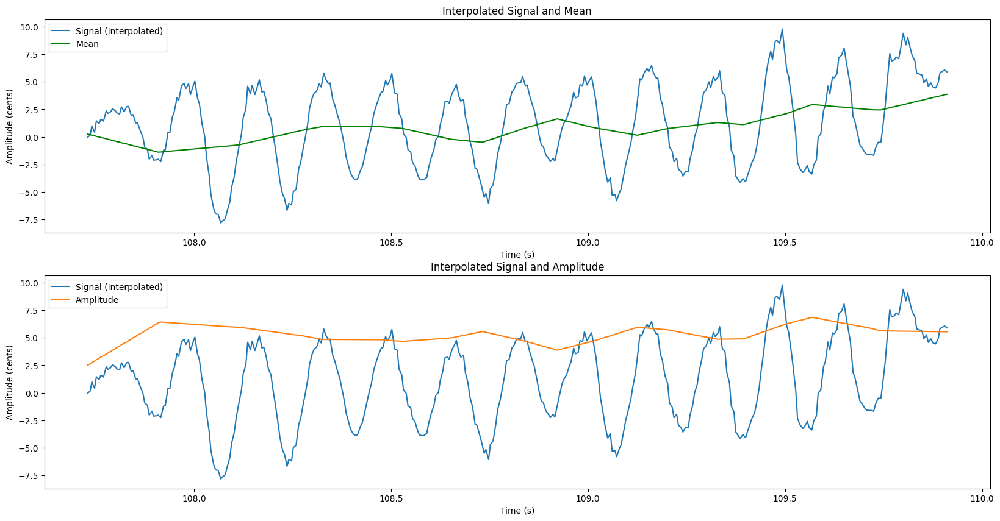

sinusoid 376
Kayser Op20-01 FabricioValvasori 



<Figure size 640x480 with 0 Axes>

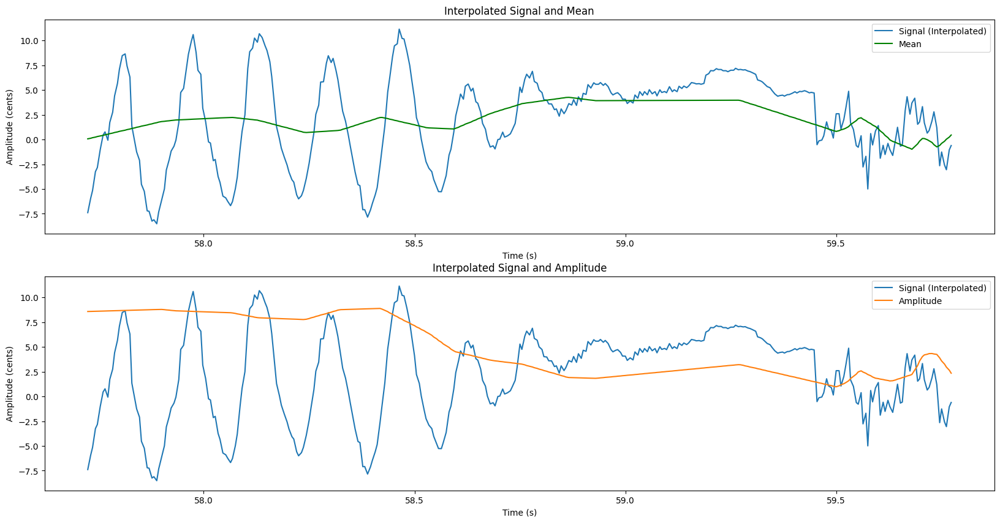

sinusoid 353
Kayser Op20-01 JPRafferty 



<Figure size 640x480 with 0 Axes>

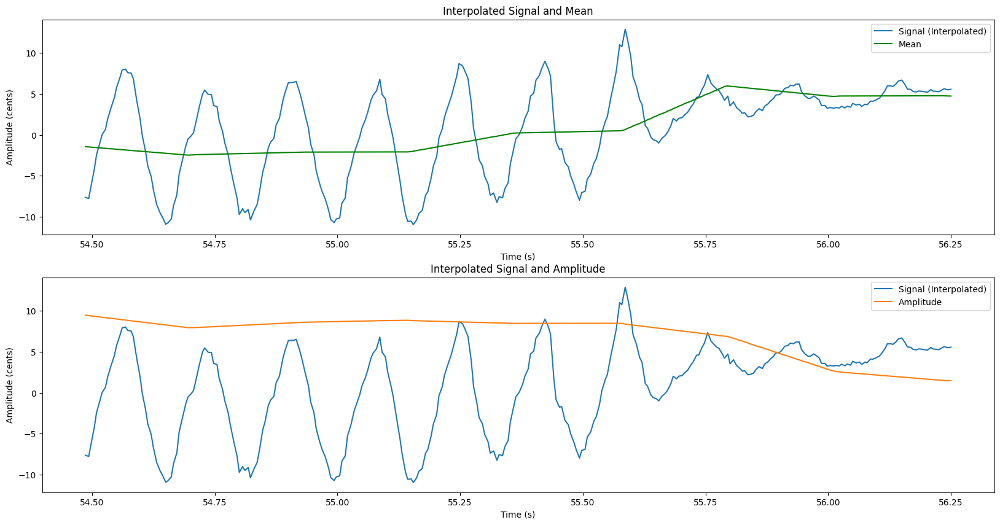

sinusoid 304
Kayser Op20-01 MikeChau 



<Figure size 640x480 with 0 Axes>

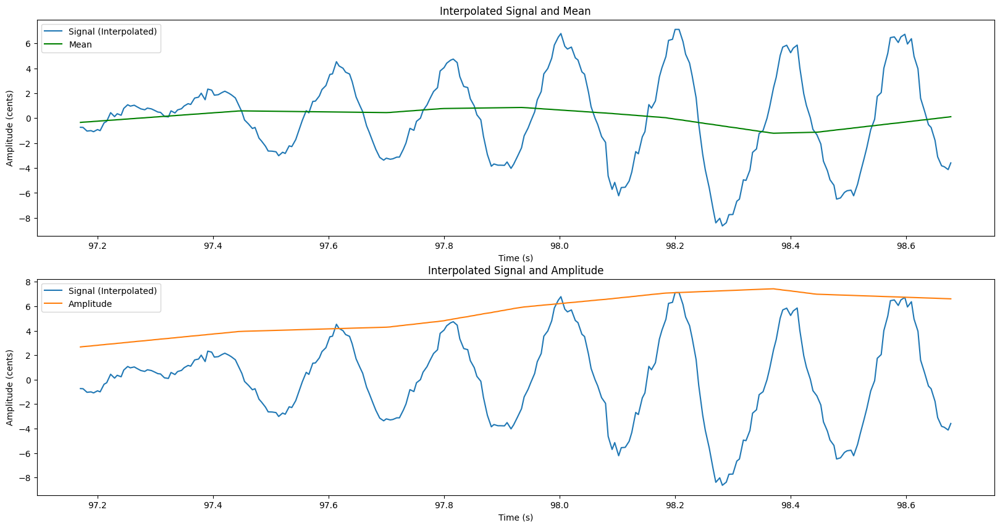

sinusoid 260
Kayser Op20-01 SunKim 



<Figure size 640x480 with 0 Axes>

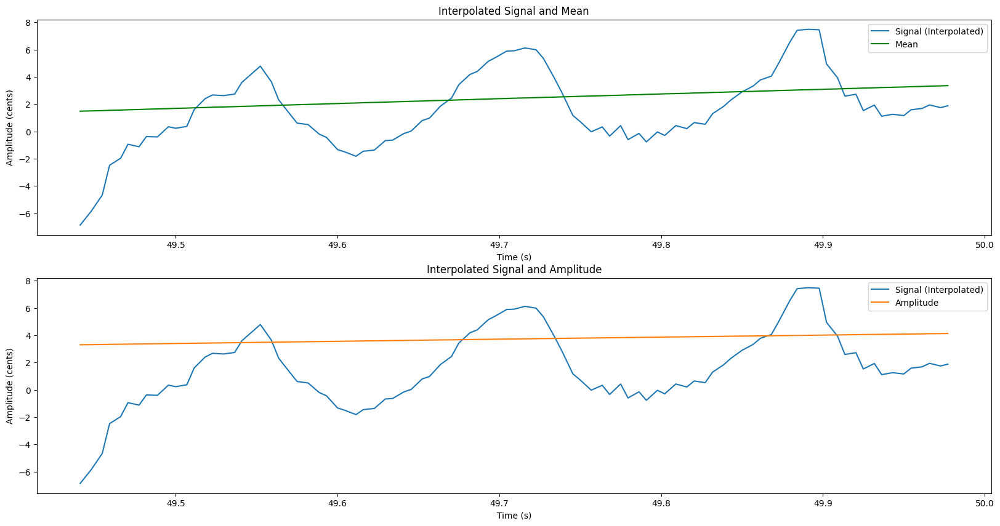

sinusoid 93


<Figure size 640x480 with 0 Axes>

In [23]:
all_plots={}
main_parameters = {}
for keys, values in dictionary_df_selected_samples.items():
    name_part = keys.split('_')[0]+' '+keys.split('_')[1]+' '+keys.split('_')[2]
    print(name_part, '\n')

    my_selected_signal = values['selected_signal_samples']
    my_selected_time = values['selected_time_samples']

    vibrato_frequency = freqvibrato_functions.find_frrt_frequency(my_signal)
    interpolated_values_upp, interpolated_values_down, frequency_peaks = freqvibrato_functions.find_peaks_and_interpolate(my_selected_signal, my_selected_time, name_part)

    amplitude = (interpolated_values_upp - interpolated_values_down)/2 #time varying amplitude
    mean = (interpolated_values_upp + interpolated_values_down)/2 #time varying mean

    interp_func = interp1d(np.arange(len(my_selected_signal)), my_selected_signal)
    signal_interpolated = interp_func(np.linspace(0, len(my_selected_signal)-1, len(my_selected_time)))


    peak_functions.draw_vibrato_plots(my_selected_time, signal_interpolated, mean, amplitude)

    phase_shift = 0.0
    sinusoid = freqvibrato_functions.model_time_varying_vibrato_sinusoid(my_selected_signal, my_selected_time, name_part, mean, amplitude, frequency_peaks, phase_shift)

    main_parameters[keys] = pd.DataFrame({'Mean': mean, 'Amplitude': amplitude, 'Vibrato_Frequency': vibrato_frequency})
    all_plots[keys] = (my_selected_time, signal_interpolated, sinusoid)
    plt.clf()

8


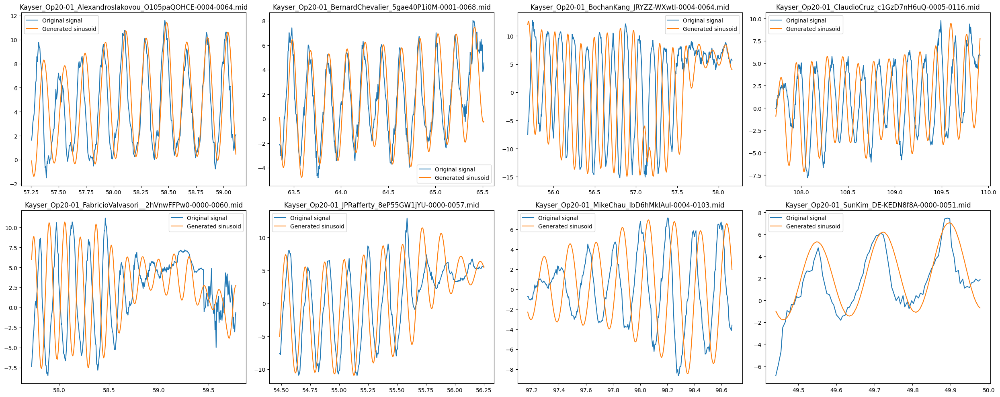

In [24]:
num_plots = len(all_plots)
print(num_plots)
num_rows = (num_plots // 4)
fig, axes = plt.subplots(num_rows, 4, figsize=(25, 10))
axes = axes.flatten()
plt.title('Pitch bend events in longest note')

for i, (key, plot_data) in enumerate(all_plots.items()):
    if i < num_plots:
        ax = fig.add_subplot(axes[i])
        signal1 = plot_data[1]
        ax.plot(plot_data[0], signal1, label='Original signal')

        signal2 = plot_data[2]
        ax.plot(plot_data[0], signal2, label='Generated sinusoid')

        ax.set_title(key)
        ax.legend()

plt.tight_layout()
plt.show()

# txt Generation

In [ ]:
selected_dfs = {}
for key in main_parameters.keys():
    df1_selected = main_parameters[key]
    df2_selected_first_row = keys_dictionary_df[key][['start_time', 'end_time', 'pitch']].iloc[[0]].values.repeat(len(df1_selected), axis=0)
    df2_selected_first_row_df = pd.DataFrame(df2_selected_first_row, columns=['start_time', 'end_time', 'pitch'], index=df1_selected.index)
    selected_df = pd.concat([df1_selected, df2_selected_first_row_df], axis=1)
    selected_dfs[key] = selected_df
    # export to txt
    file_path = '/Users/maria/Desktop/master/master_thesis/' + os.path.splitext(key)[0] + 'Mean_Amplitude _Frequency_start_time_end_time_pitch.txt'
    selected_df.to_csv(file_path, sep='\t', index=False)

combined_df = pd.concat(selected_dfs, axis=0, keys=main_parameters.keys())
